# Reports generation

In [1]:
import warnings
warnings.filterwarnings(action='ignore')

In [2]:
import pandas as pd
import numpy as np
import psycopg2 
from dataclasses import dataclass
import matplotlib.pyplot as plt
import seaborn as sns
import openpyxl 

In [ ]:
%matplotlib inline

In [3]:
class NotFoundError(Exception):
    pass

In [4]:
class EmptyQuery(Exception):
    pass


In [5]:
class DbName:
   PROFILE = "msprofileproduction"
   CONTENT = "mscontentproduction"
   STATS = "msstats"

In [6]:
class Host:
   LOCAL = "localhost"
   REMOTE = ""

In [7]:
class Template:
    PROFILE= '''
             select
                distinct p.email as CORREO,
                p.id as PROFILE_ID,
                p."role" as rol,
                p."createdAt"::date as FECHA, 
                unaccent(trim(initcap(p.mayor))) as PROGRAMA,
                i."slug" as IES,
                coalesce (s."seguidores",0) as SEGUIDORES
            from
                profile p join institution i ON
                i.id =p."belongsToId"
                left join seguidores s on s."profileId_2"=p.id
            where
                i."slug" in ({})
                and lower(p."lastName") not like '%booklick%'
                and lower(p."email") not like '%booklick%'
            group by
                  p."createdAt",
                  p.id,
                  p."role",
                  i."slug" ,
                  p.email,
                  unaccent(trim(initcap(p.mayor))),
                  s."seguidores" '''
    LOGIN= '''
                select 
                    "user" as CORREO,
                     "createdAt"::date as FECHA,
                     "env" as IES
                from
                    login l 
                where "env" in ({})
                                '''
    CONTENT='''
                with redirects as (
                    select 
                        distinct on (slug) slug, 
                        count(r.id) as redirects 
                    from redirect r
                    group by 
                        slug
                    )
                select 
                    rp.email as correo,
                    rp."role" as rol,
                    initcap(trim(unaccent(rp.mayor))) as programa,
                    rc."createdAt" ::date as fecha,
                    rc.title as titulo,
                    rct."label" as tipo,
                    rp.slug as ies,
                    red.redirects as redirecciones
                from remote_profile2 rp join
                     remote_content1 rc on rc.author = rp.email right join 
                     remote_content_type rct on rct.id =rc."type" left join 
                     redirects red on red.slug=rc.slug 
                where 
                    rp.slug in ({})'''

In [8]:
@dataclass
class Query:
    template:Template
    param:str
    
    @property
    def compile_query(self)->str:
        return self.template.format(self.param)


In [9]:
@dataclass
class BkData:
    user:str="booklickdb"
    password:str="b00kl1ck2017"
    host:Host=Host.LOCAL
    port:str = "5432"
    database:DbName=DbName.PROFILE
    query:Query=Query(Template.PROFILE,"'areandina'").compile_query
    

    @property
    def fetch_data(self)->pd.DataFrame:
        connection = psycopg2.connect(user= self.user,
                                          password= self.password,
                                          host= self.host,
                                          port= self.port,
                                          database= self.database)

        try:

            cursor = connection.cursor()
            query = self.query
            result= pd.read_sql(query, connection)
            if result is None:
                raise EmptyQuery('empty query')
            cursor.close()
            return result

        except (Exception, psycopg2.Error) as error :
            print (error)
            raise NotFoundError('unable to execute query')

        finally:
            print('closing DB')
            connection.close()

In [493]:
profile=BkData(query=Query(Template.PROFILE,"'areandina','cuc'").compile_query).fetch_data

closing DB


In [11]:
login=BkData(database=DbName.STATS,
                query=Query(Template.LOGIN,"'areandina'").compile_query).fetch_data

closing DB


In [494]:
content=BkData(database=DbName.STATS,
                query=Query(Template.CONTENT,"'areandina','cuc'").compile_query).fetch_data

closing DB


In [246]:
class Schema:
    ROLE='rol'
    DATE='fecha'
    MAJOR='programa'
    CTYPE='tipo'
    IES='ies'
    CREATOR='correo'
    CONTENT_CREATED='contenido_creado'
    REDIRECT='redirecciones'

In [14]:
def generalize_topn(ser,n=10,other='Otro'):
    topn=ser.value_counts().index[:n]
    ser=ser.cat.set_categories(
            topn.set_categories(list(topn)+[other]))
    return ser.where(ser.isin(topn),other)    

In [15]:
def elim_top_col_hierarchy(df_):
    cols=[cs[1] for cs in df_.columns.to_flat_index()]
    df_.columns=cols
    return df_

In [16]:
def excel_write(df,file:str,sheet_name:str,startcol=1,startrow=3):
    
        df.to_excel(file, sheet_name=sheet_name,
                   engine='openpyxl',startcol=startcol,
                   startrow=startrow)

In [229]:
def excel_append(df,file:str,sheet_name:str,startcol=1,startrow=3,mode='a'):
    
    with pd.ExcelWriter(file,
                    mode=mode,if_sheet_exists='overlay') as writer:  
        df.to_excel(writer, sheet_name=sheet_name,
                   engine='openpyxl',startcol=startcol,
                   startrow=startrow)

In [441]:
def subset_date(df,date_col:Schema,date1:str,date2:str):
    
      return (df
                .set_index(pd.to_datetime(df[date_col],infer_datetime_format=True))
                .sort_index() 
                .dropna(subset=date_col) 
                .loc[date1:date2,:])

In [206]:
def tweak_profile(df,date_col:Schema, agg_col:Schema):
  
    return (df
        .assign(fecha=lambda _df:pd.to_datetime(_df[date_col],infer_datetime_format=True),
                rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
                programa=lambda _df:_df.programa.str.upper().astype('category').pipe(generalize_topn))
        .groupby([pd.Grouper(key=date_col,freq='M'),agg_col])
        .agg(registros=('correo','count')).reset_index()
        .assign(Fecha=lambda _df:_df.fecha.dt.strftime('%b-%Y'))
        .pivot_table(index=[date_col,'Fecha'],
                     columns=[agg_col])
        .fillna(0).astype('int64').droplevel(0)
        .pipe(elim_top_col_hierarchy)      
                
) 

In [464]:
def tweak_content(df,date_col:Schema, agg_col:Schema,agg_value:Schema):
    """returns a pivot table with date as index  """
    
    top15creators=df.correo.value_counts().index[:15].tolist()
  
    return (df
        .assign(fecha=pd.to_datetime(df[date_col],infer_datetime_format=True),
                 redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
                 rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
                 programa=lambda _df:_df.programa.str.upper().astype('category').pipe(generalize_topn),
                 correo=lambda _df:_df.correo.where(_df.correo.isin(top15creators),'Otro').str.split('@',expand=True)[0])
        .groupby([pd.Grouper(key=date_col,freq='M'),agg_col])
        .agg(contenido_creado=('titulo','count'),
             redirecciones=('redirecciones','sum')).reset_index() 
        .assign(Fecha=lambda _df:_df.fecha.dt.strftime('%b-%Y'))
        .pivot_table(index=[date_col,'Fecha'],
                     columns=[agg_col],
                     values=[agg_value])
        .fillna(0).astype('int64').droplevel(0)
        .pipe(elim_top_col_hierarchy)
        )      

In [227]:
def insert_img(xlsx_file:str,img_loc:str,
               anchor_cell:str,
               img_width:int = 900,
               img_height:int = 400,
               worksheet_idx:int=0)->None:
    
    wb = openpyxl.load_workbook(xlsx_file)
    ws = wb.worksheets[worksheet_idx]
    img = openpyxl.drawing.image.Image(img_loc)
    img.width = img_width
    img.height = img_height
    ws.add_image(img, anchor_cell)
    wb.save(xlsx_file)

In [232]:
def remove_gridlines(xlsx_file:str, worksheet_idx:int=0):
    wb = openpyxl.load_workbook(xlsx_file)
    ws = wb.worksheets[worksheet_idx]
    ws.sheet_view.showGridLines = False
    wb.save(xlsx_file)

In [505]:
color_palette=["#440154","#482677","#404788","#33638d","#287d8e","#1f968b","#29af7f","#55c667",
               "#73d055","#b8de29","#fde725"]

In [244]:
def save_line_plot(df,img_name:str,fact:str):
    fig,ax= plt.subplots(dpi=600,figsize=(10,4))
    sns.set_style('dark')
    
    (df.plot.line(ax=ax,title=f"{fact} en el tiempo",color='purple' )
    .legend(bbox_to_anchor=(1,1))
    )
    return fig.savefig(img_name,dpi=600,bbox_inches='tight')

In [172]:
def save_bar_plot(df,img_name:str,fact:str,dim:str):
    fig,ax= plt.subplots(dpi=600,figsize=(10,4))
    sns.set_style('dark')
    
    (df.plot.bar(ax=ax,stacked=True,title= f"{fact} por {dim}" )
    .legend(bbox_to_anchor=(1,1))
    )
    return fig.savefig(img_name,dpi=600,bbox_inches='tight')    
    

In [190]:
def save_heatmap(df,img_name:str,fact:str,dim:str):
    fig,ax= plt.subplots(dpi=600,figsize=(10,4))
    sns.set_style('dark')
    
    sns.heatmap(ax=ax,data=df,
            annot=True,
            fmt='d',
            annot_kws={'size': 8},
            cmap='YlGnBu',linewidth=.8)

    ax.set(xlabel=dim)
    ax.set(ylabel='Fecha')
    ax.set(title=f'{fact} por {dim} 2022')
    plt.yticks(rotation=0)
    
    return fig.savefig(img_name,dpi=600,bbox_inches='tight')   

# Reporte

## Sheet 1

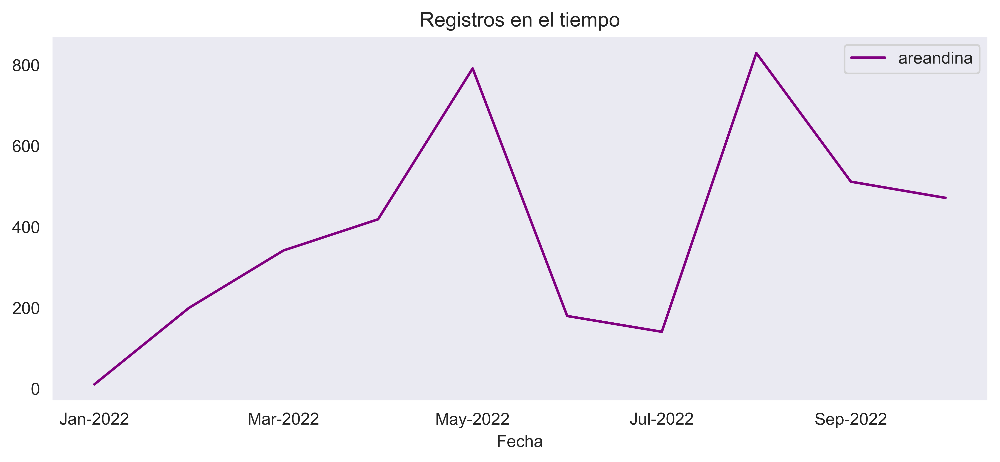

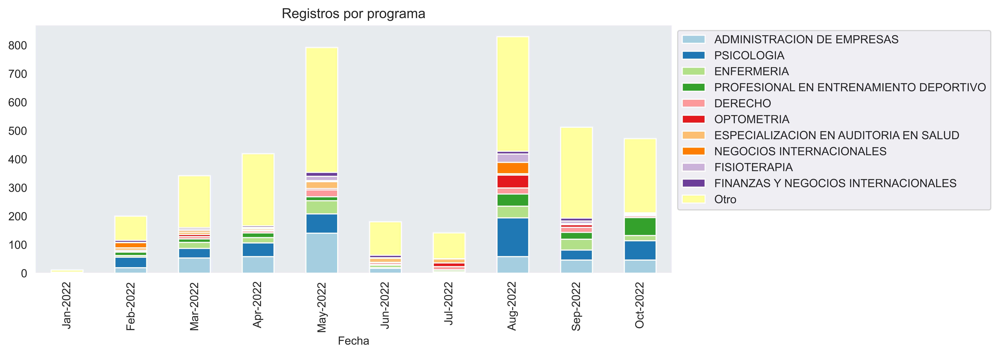

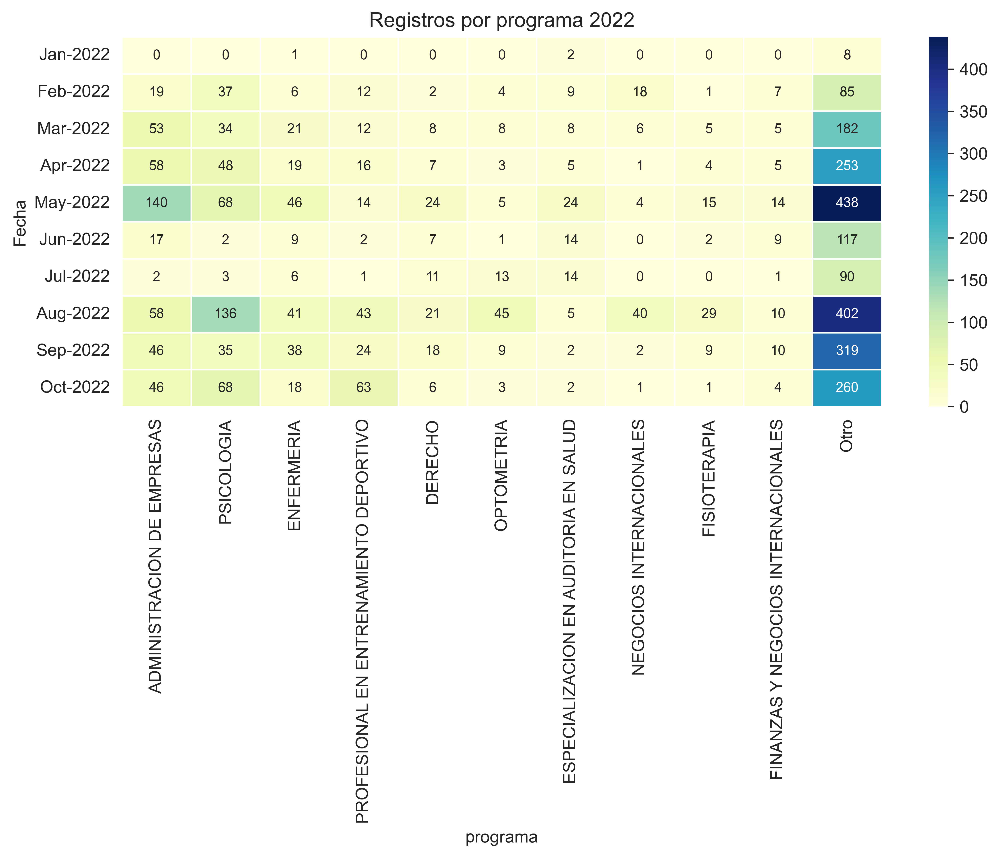

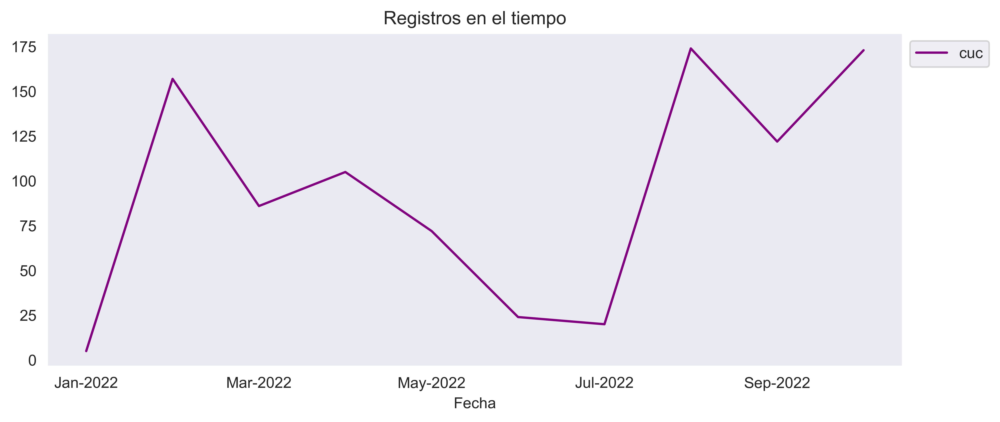

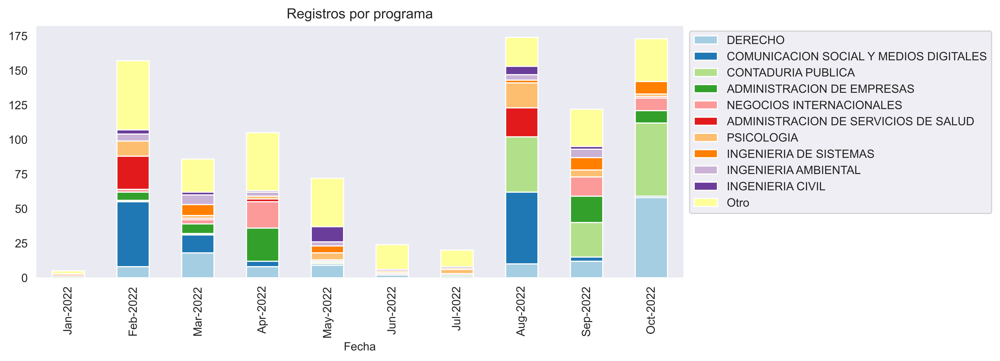

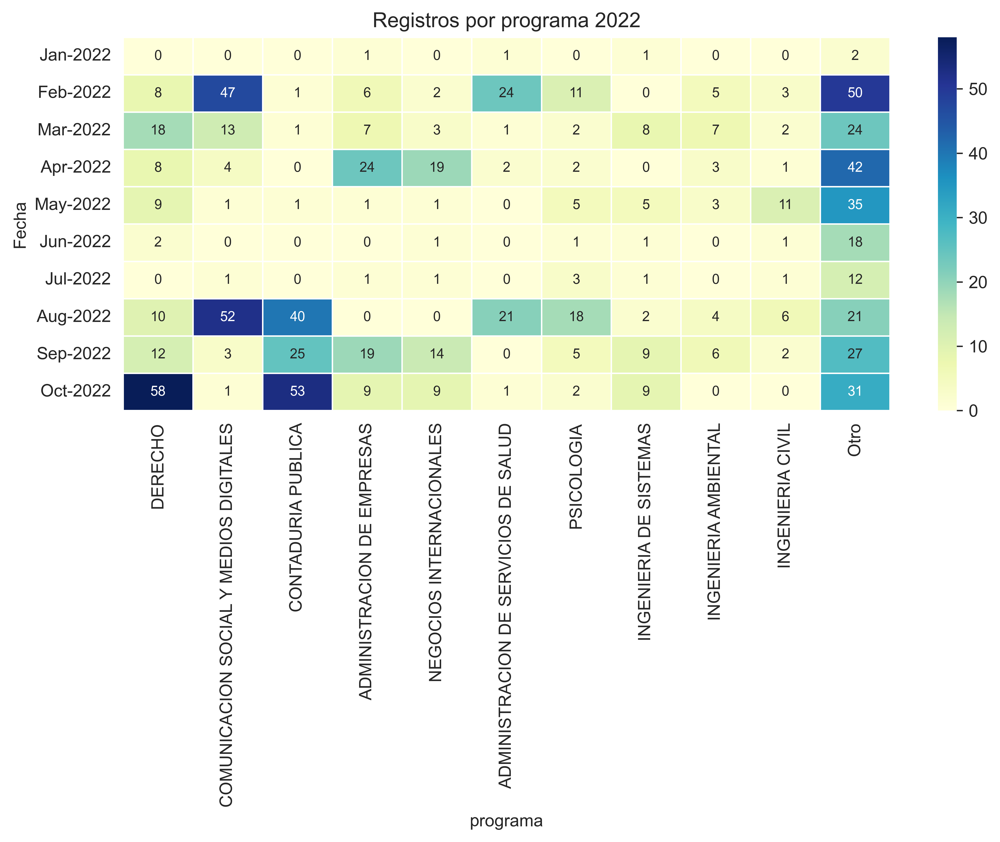

In [499]:
# global variables

IMG_NAME='temp/line.png'
BAR_IMG_NAME='temp/bar.png'
HEAT_IMG_NAME='temp/heat.png'
SHEET_NAME='registros'

IES=["areandina","cuc"]

for ies in IES:

    XLSX_FILE=f'reportes/{ies}.xlsx'

    # query specific ies data

    ies_data=profile[profile.ies==ies]

    # subset the data for 2022

    sd=subset_date(df=ies_data,
                   date_col=Schema.DATE,
                   date1='2022-01',date2='2022-12')

    # Simple dataframe

    tp=tweak_profile(df=sd,
                  date_col=Schema.DATE,
                  agg_col=Schema.IES)

    # create excel and insert dataframe 

    excel_write(df=tp,file=XLSX_FILE,
                sheet_name=SHEET_NAME)

    # create line plot and insert it in sheet

    save_line_plot(df=tp,img_name=IMG_NAME,fact='Registros')

    insert_img(xlsx_file=XLSX_FILE,
               img_loc=IMG_NAME,
               anchor_cell='E4')

    # create dataframe pivoted by major

    prog=tweak_profile(df=sd,
                  date_col=Schema.DATE,
                  agg_col=Schema.MAJOR)

    # create bar plot and insert it in sheet 

    save_bar_plot(df=prog,
                  img_name=BAR_IMG_NAME,
                  fact='Registros',dim='programa')

    insert_img(xlsx_file=XLSX_FILE,
               img_loc=BAR_IMG_NAME,
               anchor_cell='E26')

    # create heatmap and insert it in sheet 

    save_heatmap(df=prog,
                  img_name=HEAT_IMG_NAME,
                  fact='Registros',dim='programa')

    insert_img(xlsx_file=XLSX_FILE,
               img_loc=HEAT_IMG_NAME,
               anchor_cell='E49',
               img_height=800,
               img_width=850)

    # remove gridlines

    remove_gridlines(xlsx_file=XLSX_FILE)

    #insert logo

    insert_img(xlsx_file=XLSX_FILE,
               img_loc=LOGO,
               anchor_cell='A1',
               img_height=30,
               img_width=100)

## Sheet 2

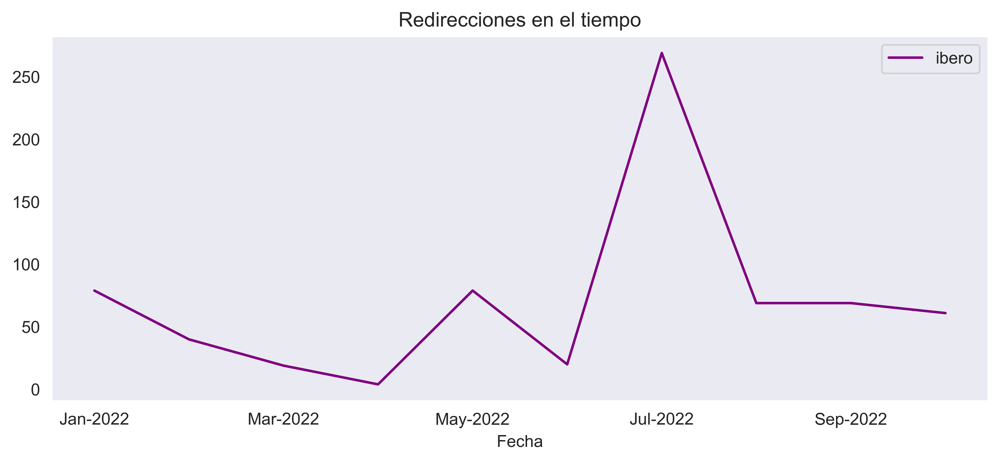

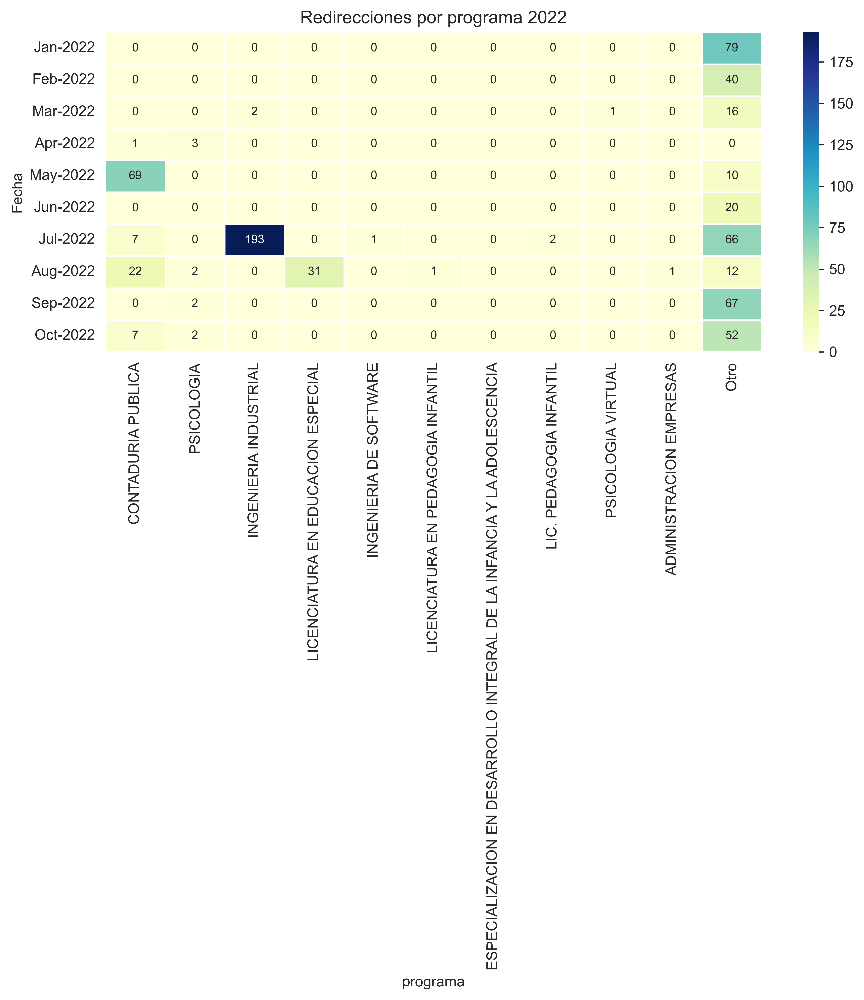

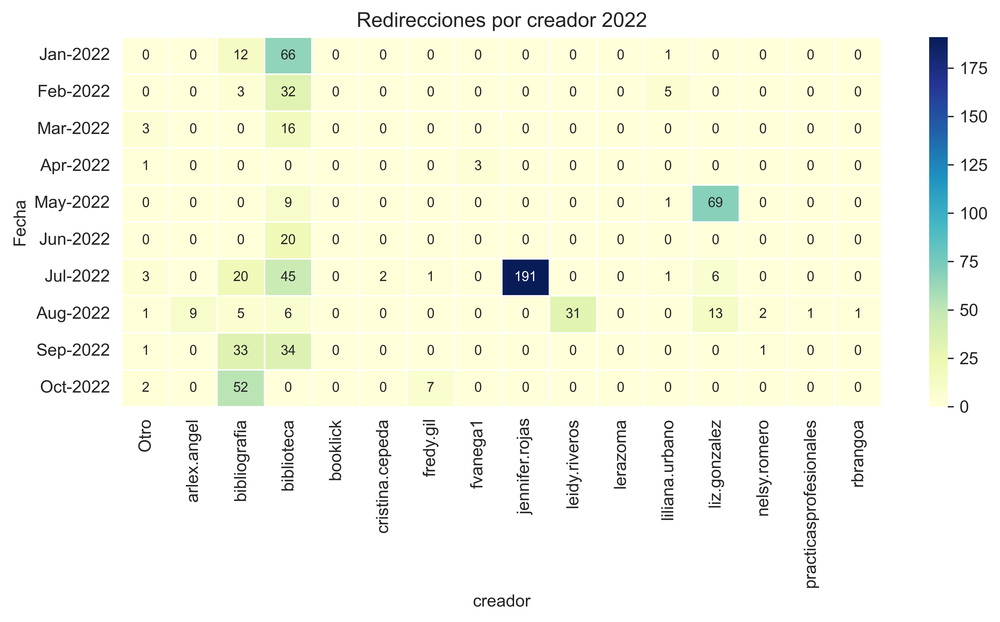

In [490]:

# global variables

LINE_IMG_NAME='temp/line.png'
BAR_IMG_NAME='temp/bar.png'
HEAT_IMG_NAME='temp/heat.png'

XLSX_FILE='reportes/ibero.xlsx'
SHEET_NAME='redirecciones'

LOGO='logo.png'

# subset the data for 2022

sd=subset_date(df=content,
               date_col=Schema.DATE,
               date1='2022-01',date2='2022-12')

# pivot data by ies -> agg val :redirects

red=tweak_content(df=sd,
               date_col=Schema.DATE,
               agg_col=Schema.IES,
               agg_value=Schema.REDIRECT)

# append to existing workbook

excel_append(df=red,file=XLSX_FILE,
            sheet_name=SHEET_NAME)


# create line plot and insert it in sheet

save_line_plot(df=red,img_name=IMG_NAME,fact='Redirecciones')

insert_img(xlsx_file=XLSX_FILE,
           img_loc=LINE_IMG_NAME,
           anchor_cell='E4',
           worksheet_idx=1)

# pivot data by major -> agg val :redirects

red_by_maj=tweak_content(df=sd,
               date_col=Schema.DATE,
               agg_col=Schema.MAJOR,
               agg_value=Schema.REDIRECT)


# create heatmap and insert it in sheet 

save_heatmap(df=red_by_maj,
              img_name=HEAT_IMG_NAME,
              fact='Redirecciones',dim='programa')

insert_img(xlsx_file=XLSX_FILE,
           img_loc=HEAT_IMG_NAME,
           anchor_cell='E26',
           img_height=800,
           img_width=800,
           worksheet_idx=1)

# pivot data by creators -> agg val :redirects

red_by_maj=tweak_content(df=sd,
               date_col=Schema.DATE,
               agg_col=Schema.CREATOR,
               agg_value=Schema.REDIRECT)


# create heatmap and insert it in sheet 

save_heatmap(df=red_by_maj,
              img_name=HEAT_IMG_NAME,
              fact='Redirecciones',dim='creador')

insert_img(xlsx_file=XLSX_FILE,
           img_loc=HEAT_IMG_NAME,
           anchor_cell='S26',
           img_height=500,
           img_width=1000,
           worksheet_idx=1)


# remove gridlines

remove_gridlines(xlsx_file=XLSX_FILE,
                 worksheet_idx=1)

#insert logo

insert_img(xlsx_file=XLSX_FILE,
           img_loc=LOGO,
           anchor_cell='A1',
           img_height=30,
           img_width=100,
           worksheet_idx=1)

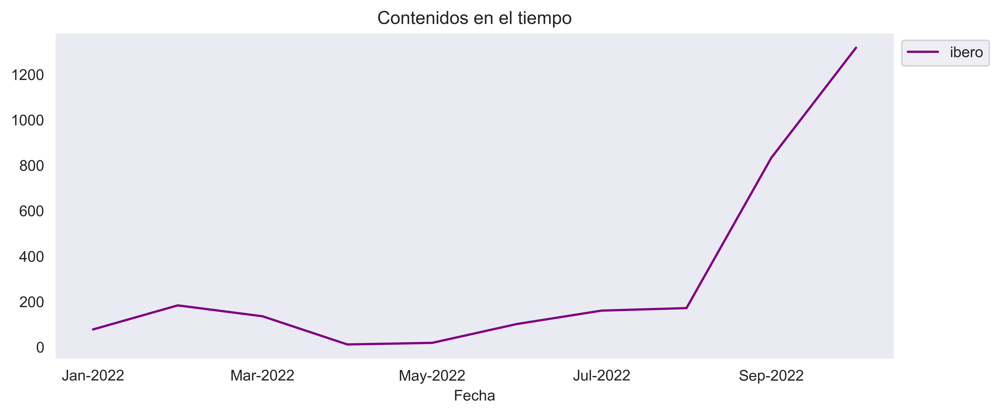

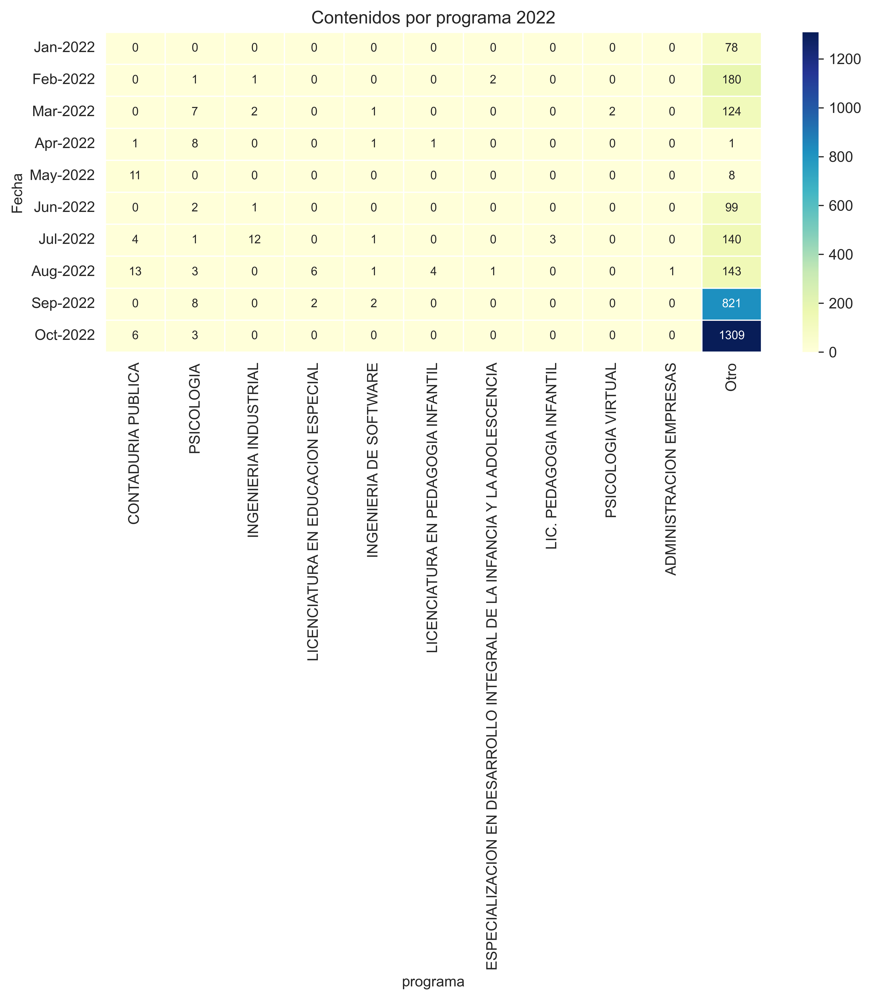

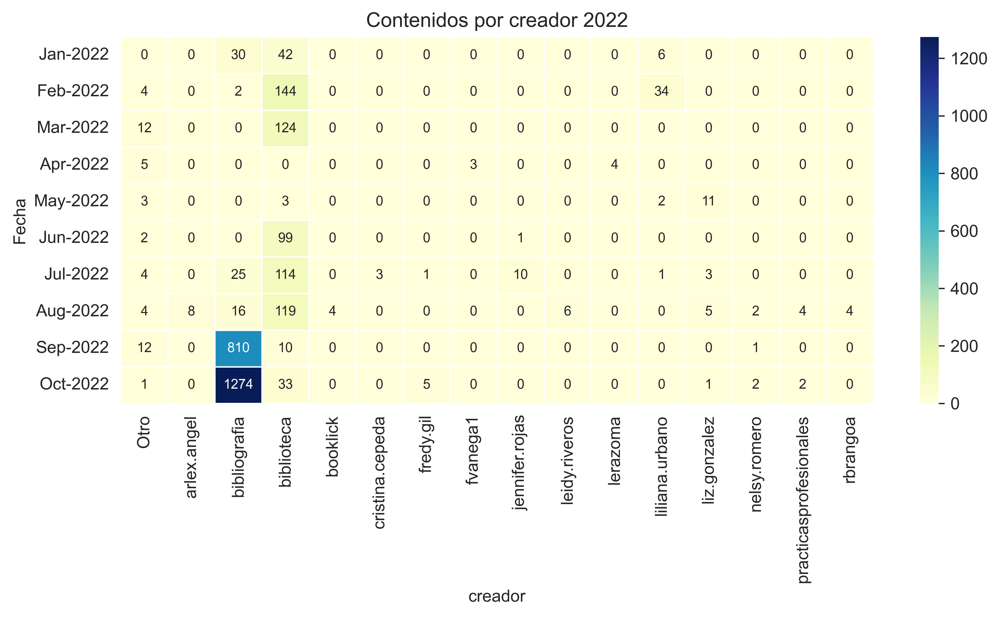

In [491]:
# global variables

LINE_IMG_NAME='temp/line.png'
BAR_IMG_NAME='temp/bar.png'
HEAT_IMG_NAME='temp/heat.png'

XLSX_FILE='reportes/ibero.xlsx'
SHEET_NAME='contenidos'

LOGO='logo.png'

# subset the data for 2022

sd=subset_date(df=content,
               date_col=Schema.DATE,
               date1='2022-01',date2='2022-12')

# pivot data by ies -> agg val :redirects

red=tweak_content(df=sd,
               date_col=Schema.DATE,
               agg_col=Schema.IES,
               agg_value=Schema.CONTENT_CREATED)

# append to existing workbook

excel_append(df=red,file=XLSX_FILE,
            sheet_name=SHEET_NAME)


# create line plot and insert it in sheet

save_line_plot(df=red,img_name=IMG_NAME,fact='Contenidos')

insert_img(xlsx_file=XLSX_FILE,
           img_loc=LINE_IMG_NAME,
           anchor_cell='E4',
           worksheet_idx=2)

# pivot data by major -> agg val :redirects

cont_by_maj=tweak_content(df=sd,
               date_col=Schema.DATE,
               agg_col=Schema.MAJOR,
               agg_value=Schema.CONTENT_CREATED)


# create heatmap and insert it in sheet 

save_heatmap(df=cont_by_maj,
              img_name=HEAT_IMG_NAME,
              fact='Contenidos',dim='programa')

insert_img(xlsx_file=XLSX_FILE,
           img_loc=HEAT_IMG_NAME,
           anchor_cell='E26',
           img_height=800,
           img_width=800,
           worksheet_idx=2)

# pivot data by creators -> agg val :redirects

cont_by_creat=tweak_content(df=sd,
               date_col=Schema.DATE,
               agg_col=Schema.CREATOR,
               agg_value=Schema.CONTENT_CREATED)


# create heatmap and insert it in sheet 

save_heatmap(df=cont_by_creat,
              img_name=HEAT_IMG_NAME,
              fact='Contenidos',dim='creador')

insert_img(xlsx_file=XLSX_FILE,
           img_loc=HEAT_IMG_NAME,
           anchor_cell='S26',
           img_height=500,
           img_width=1000,
           worksheet_idx=2)


# remove gridlines

remove_gridlines(xlsx_file=XLSX_FILE,
                 worksheet_idx=2)

#insert logo

insert_img(xlsx_file=XLSX_FILE,
           img_loc=LOGO,
           anchor_cell='A1',
           img_height=30,
           img_width=100,
           worksheet_idx=2)

In [ ]:
# wb = openpyxl.Workbook()
# ws = wb.worksheets[0]
# img = openpyxl.drawing.image.Image('temp/line_reg.png')
# img.anchor = 'D1'
# ws.add_image(img)
# wb.save('test.xlsx')


# wb = openpyxl.load_workbook('test.xlsx')
# ws = wb.worksheets[0]
# img = openpyxl.drawing.image.Image('temp/line_reg.png')
# img.width = 900
# img.height = 400
# ws.add_image(img, 'D16')
# wb.save('test.xlsx')

In [119]:

# fig,ax= plt.subplots(dpi=600,figsize=(10,4))

# sns.set_palette("Paired")
# sns.despine(left=True)
# sns.set_style('dark')


df_profile_2022=(df_profile
                    .set_index(pd.to_datetime(df_profile.fecha,infer_datetime_format=True))
                    .sort_index() 
                    .dropna(subset='fecha') 
                    .loc['2022-01':'2022-12',:])
(df_profile_2022
    .assign(fecha=lambda _df:pd.to_datetime(_df.fecha,infer_datetime_format=True))
    .groupby([pd.Grouper(key='fecha',freq='Q'),'ies'])
    .agg(registros=('correo','count'))
    .rename(lambda idx:idx,level=0)
    .pivot_table(index='fecha',columns='ies'))
#     .plot.bar(ax=ax,stacked=True,rot=45,title='Registros por mes en 2022',color='purple')
#     .legend(bbox_to_anchor=(1,1))
     
# ) 
# ax.set(xlabel='mes')
# plt.show()


,registros
ies,uninorte
fecha,
2022-03-31,777
2022-06-30,118
2022-09-30,483
2022-12-31,31


In [ ]:

df_profile_2022=(df_profile
                    .set_index(pd.to_datetime(df_profile.fecha,infer_datetime_format=True))
                    .sort_index() 
                    .dropna(subset='fecha') 
                    .loc['2022-01':'2022-12',:])
d=(df_profile_2022
    .assign(fecha=lambda _df:pd.to_datetime(_df.fecha,infer_datetime_format=True))
    .groupby([pd.Grouper(key='fecha',freq='M'),'rol'])
    .agg(registros=('correo','count'))
    .rename(lambda idx:idx.month,level=0)
    .pivot_table(index='fecha',columns=['rol']).fillna(0).astype('int64')
    .pipe(elim_top_col_hierarchy)
    
) 
with pd.ExcelWriter('test.xlsx',
                    mode='a',if_sheet_exists='overlay') as writer:  
    d.to_excel(writer, sheet_name='registros',
               engine='openpyxl',startcol=4,
               startrow=3)

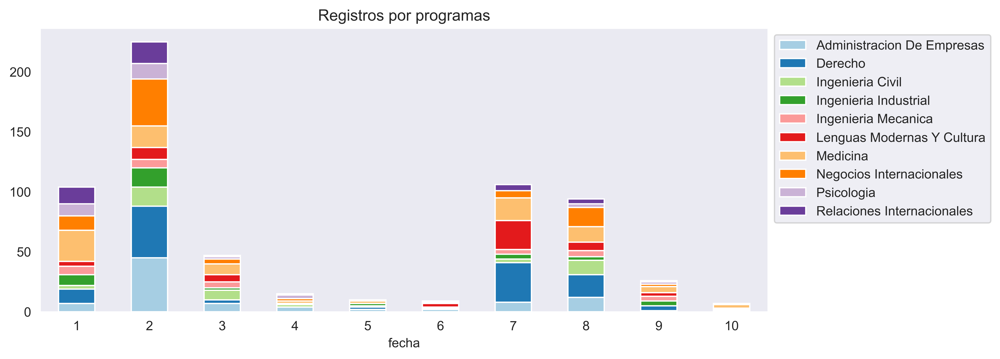

In [178]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')

df_profile_2022=(df_profile
                    .set_index(pd.to_datetime(df_profile.fecha,infer_datetime_format=True))
                    .sort_index() 
                    .dropna(subset='fecha') 
                    .loc['2022-01':'2022-12',:])

(df_profile_2022
    .assign(fecha=lambda _df:pd.to_datetime(_df.fecha,infer_datetime_format=True),
            programa=lambda _df:_df.programa.replace('',np.nan).astype('category'),
            programa_f=lambda _df:_df.programa.pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'programa_f'])
    .agg(registros=('correo','count'))
    .rename(lambda idx:idx.month,level=0)
    .query('programa_f!="Otro"')
    .pivot_table(index='fecha',columns='programa_f')
    .pipe(elim_top_col_hierarchy) 
    .plot.bar(ax=ax,stacked=True,rot=0,title='Registros por programas')
    .legend(bbox_to_anchor=(1,1))
)
plt.show()

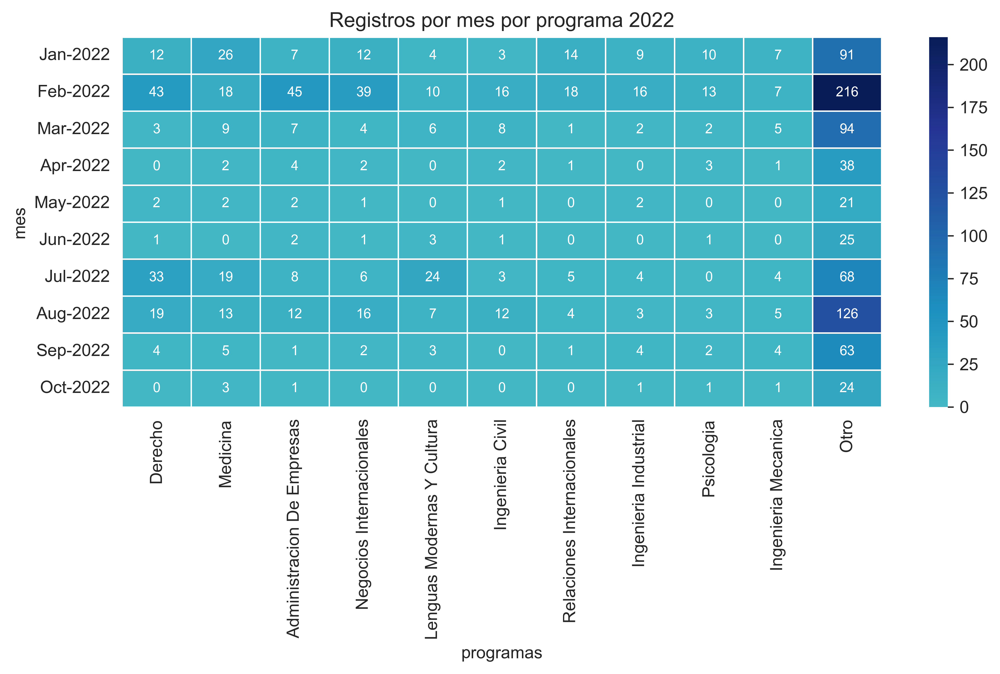

In [250]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')


df_profile_2022=(df_profile
                    .set_index(pd.to_datetime(df_profile.fecha,infer_datetime_format=True))
                    .sort_index() 
                    .dropna(subset='fecha') 
                    .loc['2022-01':'2022-12',:])

dat=(df_profile_2022
    .assign(fecha=lambda _df:pd.to_datetime(_df.fecha,infer_datetime_format=True),
            programa=lambda _df:_df.programa.replace('',np.nan).astype('category'),
            programa_f=lambda _df:_df.programa.pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'programa_f'])
    .agg(registros=('correo','count')).reset_index()
    .assign(Fecha=lambda _df:_df.fecha.dt.strftime('%b-%Y'))
    .pivot_table(index=['fecha','Fecha'],columns='programa_f').droplevel(0)
    .pipe(elim_top_col_hierarchy) 
 
)
sns.heatmap(ax=ax,data=dat,
            annot=True,
            fmt='d',
            annot_kws={'size': 8},
            cmap='YlGnBu',linewidth=.8,
            center=dat.iloc[3,8])

ax.set(xlabel='programas')
ax.set(ylabel='mes')
ax.set(title='Registros por mes por programa 2022')
plt.yticks(rotation=0)
plt.show()

In [185]:
df_profile_2022=(df_profile
                    .set_index(pd.to_datetime(df_profile.fecha,infer_datetime_format=True))
                    .sort_index() 
                    .dropna(subset='fecha') 
                    .loc['2022-01':'2022-12',:])

(df_profile_2022
    .assign(fecha=lambda _df:pd.to_datetime(_df.fecha,infer_datetime_format=True),
            programa=lambda _df:_df.programa.replace('',np.nan).astype('category'),
            programa_f=lambda _df:_df.programa.pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'programa_f'])
    .agg(registros=('correo','count')).reset_index()
    .assign(Fecha=lambda _df:_df.fecha.dt.strftime('%b-%Y'))
    .pivot_table(index=['fecha','Fecha'],columns='programa_f').droplevel(0)
    .pipe(elim_top_col_hierarchy)  
)

,Derecho,Medicina,Administracion De Empresas,Negocios Internacionales,Lenguas Modernas Y Cultura,Ingenieria Civil,Relaciones Internacionales,Ingenieria Industrial,Psicologia,Ingenieria Mecanica,Otro
Fecha,,,,,,,,,,,
Jan-2022,12,26,7,12,4,3,14,9,10,7,91
Feb-2022,43,18,45,39,10,16,18,16,13,7,216
Mar-2022,3,9,7,4,6,8,1,2,2,5,94
Apr-2022,0,2,4,2,0,2,1,0,3,1,38
May-2022,2,2,2,1,0,1,0,2,0,0,21
Jun-2022,1,0,2,1,3,1,0,0,1,0,25
Jul-2022,33,19,8,6,24,3,5,4,0,4,68
Aug-2022,19,13,12,16,7,12,4,3,3,5,126
Sep-2022,4,5,1,2,3,0,1,4,2,4,63


In [254]:
# subset the data for 2022

sd=subset_date(df=content,
               date_col=Schema.DATE,
               date1='2022-01',date2='2022-12')

# pivot data by ies -> agg val :redirects

red=tweak_content(df=sd,
               date_col=Schema.DATE,
               agg_col=Schema.ROLE,
               agg_value=Schema.REDIRECT)

In [414]:
d=red.stack().to_frame().reset_index().rename({0:'red'},axis=1)

In [341]:
d

,Fecha,level_1,red
0,Feb-2022,Otro,0
1,Feb-2022,admin,534
2,Feb-2022,student,3
3,Feb-2022,teacher,369
4,Mar-2022,Otro,0
5,Mar-2022,admin,55
6,Mar-2022,student,12
7,Mar-2022,teacher,405
8,Apr-2022,Otro,0
9,Apr-2022,admin,0


In [342]:
d2=red.unstack()

In [343]:
d2.reset_index()

,level_0,Fecha,0
0,Otro,Feb-2022,0
1,Otro,Mar-2022,0
2,Otro,Apr-2022,0
3,Otro,May-2022,0
4,Otro,Jun-2022,0
5,Otro,Jul-2022,0
6,Otro,Aug-2022,0
7,Otro,Sep-2022,0
8,Otro,Oct-2022,0
9,admin,Feb-2022,534


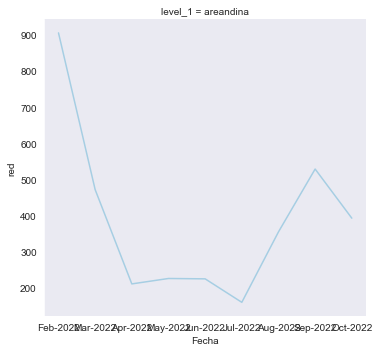

In [417]:
sns.relplot(data=d,x='Fecha',
            y='red',kind='line',col='level_1',col_wrap=2)

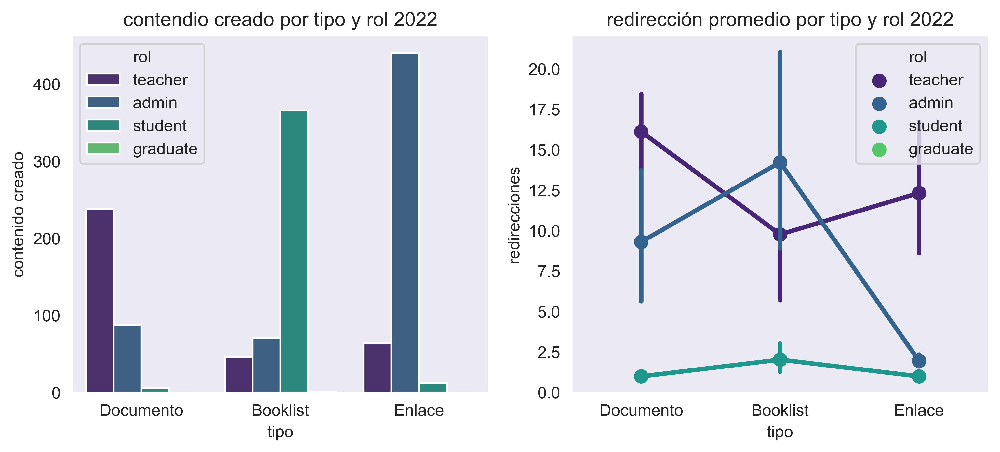

In [504]:
content22=(content
                .set_index(pd.to_datetime(content.fecha,infer_datetime_format=True))
                .sort_index() 
                .dropna(subset='fecha') 
                .loc['2022-01':'2022-12',:])

fig,(ax0,ax1)= plt.subplots(dpi=600,figsize=(10,4),
                           nrows=1,ncols=2,sharey=False)
sns.set_style('dark')
sns.set_palette('Paired')
sns.pointplot(data=content22.assign(redirecciones=content22.redirecciones.clip(upper=100)),
              x='tipo',y='redirecciones',hue='rol',
              ax=ax1,palette=color_palette[1::2])
sns.countplot(data=content22,x='tipo',hue='rol',ax=ax0,palette=color_palette[1::2])

ax0.set(ylabel='contenido creado',title='contendio creado por tipo y rol 2022') 
ax1.set(title='redirección promedio por tipo y rol 2022') 
plt.show()

redirecciones                               \
correo   acastellanos31@areandina.edu.co aguerrero62@areandina.edu.co   
Fecha                                                                   
Feb-2022                               0                            0   
Mar-2022                               0                            0   
Apr-2022                               0                            0   
May-2022                               0                            0   
Jun-2022                               0                            0   
Jul-2022                               0                            0   
Aug-2022                               0                            0   
Sep-2022                               0                            0   
Oct-2022                               0                            0   

                                                             \
correo   amesa@areandina.edu.co apinilla19@areandina.edu.co   
Fecha                                                         
Feb-2022                      0                           0   
Mar-2022                      0                           0   
Apr-2022                      0                           0   
May-2022                      0                           0   
Jun-2022                      3                           0   
Jul-2022                      0                           0   
Aug-2022                      0                           0   
Sep-2022                      0                           0   
Oct-2022                      0                           0   

                                                                           \
correo   arodriguez554@areandina.edu.co bibliotecabogota@areandina.edu.co   
Fecha                                                                       
Feb-2022                              0                               534   
Mar-2022                              0                                50   
Apr-2022                              0                                 0   
May-2022                              0                                 0   
Jun-2022                              0                                 0   
Jul-2022                              0                                 9   
Aug-2022                              0                                 0   
Sep-2022                              0                                13   
Oct-2022                              0                                 0   

                                                             \
correo   bmora@areandina.edu.co cagallego4@areandina.edu.co   
Fecha                                                         
Feb-2022                      0                           0   
Mar-2022                      0                           0   
Apr-2022                      0                           0   
May-2022                      0                           0   
Jun-2022                      1                           0   
Jul-2022                      0                           0   
Aug-2022                      0                           0   
Sep-2022                      0                           0   
Oct-2022                      0                           0   

                                                                ...  \
correo   ccruz45@areandina.edu.co csolorzano3@areandina.edu.co  ...   
Fecha                                                           ...   
Feb-2022                        0                            0  ...   
Mar-2022                        0                            0  ...   
Apr-2022                        0                            0  ...   
May-2022                        0                            0  ...   
Jun-2022                        0                          215  ...   
Jul-2022                        0                          139  ...   
Aug-2022                        1                           35  ...   
S

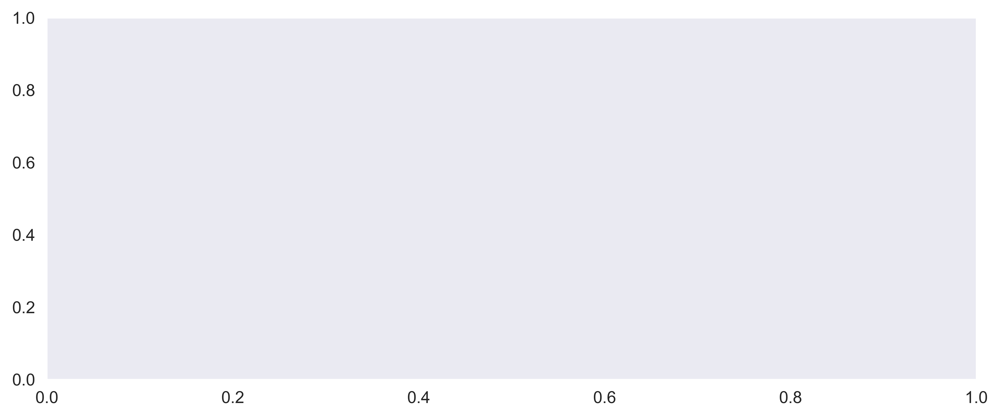

In [356]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')

content22=(content
                .set_index(pd.to_datetime(content.fecha,infer_datetime_format=True))
                .sort_index() 
                .dropna(subset='fecha') 
                .loc['2022-01':'2022-12',:])

(content22
    .assign(fecha=pd.to_datetime(content22.fecha,infer_datetime_format=True),
             redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
             rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
             programa=lambda _df:_df.programa.astype('category').pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'correo'])
    .agg(contenido_creado=('titulo','count'),
         redirecciones=('redirecciones','sum')).reset_index()
    .assign(Fecha=lambda _df:_df.fecha.dt.strftime('%b-%Y'))
    .pivot_table(index=['fecha','Fecha'],
                 columns=['correo'],
                values=['redirecciones']).fillna(0).astype('int64').droplevel(0)
#     .pipe(elim_top_col_hierarchy)  
)

# sns.relplot(data=d,x='Fecha',y='red',kind='line',col='level_1',col_wrap=2)
# plt.show()

In [ ]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')

content22=(content
                .set_index(pd.to_datetime(content.fecha,infer_datetime_format=True))
                .sort_index() 
                .dropna(subset='fecha') 
                .loc['2022-01':'2022-12',:])

(content22
    .assign(fecha=pd.to_datetime(content22.fecha,infer_datetime_format=True),
             redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
             rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
             programa=lambda _df:_df.programa.astype('category').pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'tipo'])
    .agg(contenido_creado=('titulo','count'),
         redirecciones=('redirecciones','sum')) 
    .rename(lambda idx:idx.month,level=0)
    .pivot_table(index='fecha',
                 columns=['tipo'],
                 values=['contenido_creado'])
     .pipe(elim_top_col_hierarchy) 
    .plot.bar(ax=ax,stacked=True,title='contendido creado en 2022 por tipo',rot=0)
    .legend(bbox_to_anchor=(1,1)) 
)
plt.show()

In [ ]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')


(content22
    .assign(fecha=pd.to_datetime(content22.fecha,infer_datetime_format=True),
             redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
             rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
             programa=lambda _df:_df.programa.astype('category').pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'tipo'])
    .agg(contenido_creado=('titulo','count'),
         redirecciones=('redirecciones','sum')) 
    .rename(lambda idx:idx.month,level=0)
    .pivot_table(index='fecha',
                 columns=['tipo'],
                 values=['redirecciones'])
    .pipe(elim_top_col_hierarchy) 
    .plot.bar(ax=ax,stacked=True,title='Redirecciones por tipo 2022',rot=0,ylabel='redirecciones')
    .legend(bbox_to_anchor=(1,1)) 
)
plt.show()

In [ ]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')


(content22
    .assign(fecha=pd.to_datetime(content22.fecha,infer_datetime_format=True),
             redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
             rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
             programa=lambda _df:_df.programa.astype('category').pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'programa'])
    .agg(contenido_creado=('titulo','count'),
         redirecciones=('redirecciones','sum')) 
    .rename(lambda idx:idx.month,level=0)
    .pivot_table(index='fecha',
                 columns=['programa'],
                 values=['redirecciones'])
    .pipe(elim_top_col_hierarchy) 
    .plot.bar(ax=ax,stacked=True,title='Redirecciones por programa 2022',rot=0)
    .legend(bbox_to_anchor=(1,1)) 
)
plt.show()

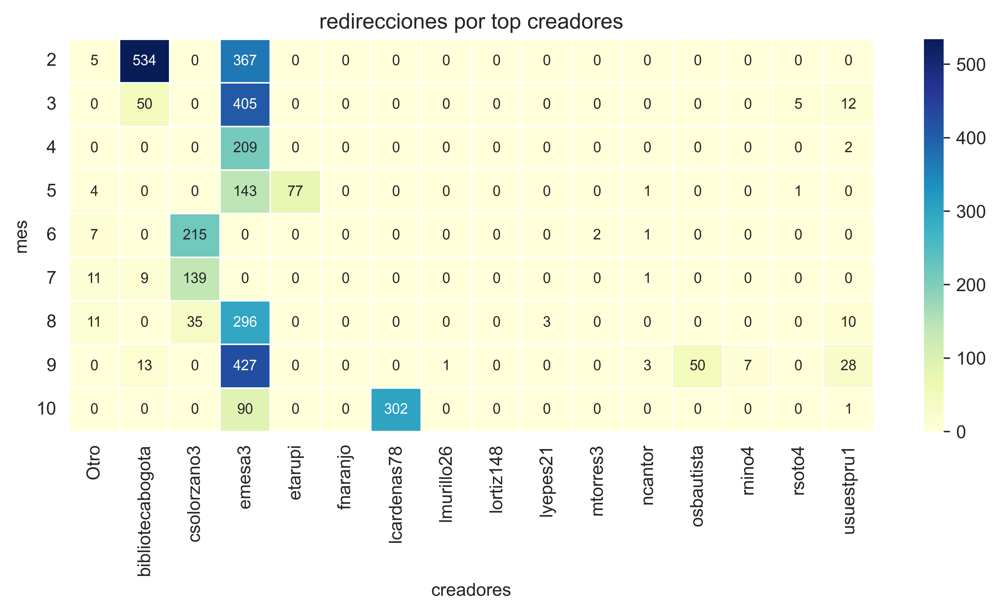

In [388]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')

top15creators=content22.correo.value_counts().index[:15].tolist()

d=(content22
    .assign(fecha=pd.to_datetime(content22.fecha,infer_datetime_format=True),
             redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
             rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
             programa=lambda _df:_df.programa.astype('category').pipe(generalize_topn),
             correo=lambda _df:_df.correo.where(_df.correo.isin(top15creators),'Otro').str.split('@',expand=True)[0])
    .groupby([pd.Grouper(key='fecha',freq='M'),'correo'])
    .agg(contenido_creado=('titulo','count'),
         redirecciones=('redirecciones','sum')) 
    .rename(lambda idx:idx.month,level=0)
    .pivot_table(index='fecha',
                 columns=['correo'],
                 values=['redirecciones']).fillna(0).astype('int64')
    .pipe(elim_top_col_hierarchy) 
#     .plot.bar(ax=ax,stacked=True,title='Redirecciones por mayores creadores de contendido en 2022',rot=0)
#     .legend(bbox_to_anchor=(1,1)) 
)
sns.heatmap(ax=ax,data=d,
            annot=True,
            fmt='d',
            annot_kws={'size': 8},
            cmap='YlGnBu',linewidth=.8)

ax.set(xlabel='creadores')
ax.set(ylabel='mes')
ax.set(title='redirecciones por top creadores')
# ax.set_xticklabels([x.split('@')[0] for x in top15creators +['Otro']])
plt.yticks(rotation=0)
plt.show()
plt.show()

In [ ]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')

top15creators=content22.correo.value_counts().index[:15].tolist()
top15titles=content22.sort_values(by='redirecciones',ascending=False)['titulo'].iloc[0:10].tolist()

(content22
    .assign(fecha=pd.to_datetime(content22.fecha,infer_datetime_format=True),
             redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
             rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
             programa=lambda _df:_df.programa.astype('category').pipe(generalize_topn),
             correo=lambda _df:_df.correo.where(_df.correo.isin(top15creators),'Otro'),
             titulo=lambda _df:_df.titulo.where(_df.titulo.isin(top15titles),'Otro'))
    .groupby([pd.Grouper(key='fecha',freq='M'),'titulo'])
    .agg(contenido_creado=('titulo','count'),
         redirecciones=('redirecciones','sum')) 
    .rename(lambda idx:idx.month,level=0)
    .pivot_table(index='fecha',
                 columns=['titulo'],
                 values=['redirecciones'])
    .plot.bar(ax=ax,stacked=True,title='Redirecciones por programa 2022',rot=0)
    .legend(bbox_to_anchor=(1,1)) 
)
plt.show()

In [ ]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
sns.set_style('dark')
sns.set_palette('Paired')

content22=(content
                .set_index(pd.to_datetime(content.fecha,infer_datetime_format=True))
                .sort_index() 
                .dropna(subset='fecha') 
                .loc['2022-01':'2022-12',:])
(content22
    .assign(fecha=pd.to_datetime(content22.fecha,infer_datetime_format=True),
             redirecciones=lambda _df:_df.redirecciones.fillna(0).astype('int64'),
             rol=lambda _df:_df.rol.where(_df.rol.isin(['student','teacher','admin']),'Otro'),
             programa=lambda _df:_df.programa.astype('category').pipe(generalize_topn))
    .groupby([pd.Grouper(key='fecha',freq='M'),'tipo'])
    .agg(contenido_creado=('titulo','count'),
         redirecciones=('redirecciones','sum')) 
    .rename(lambda idx:idx.month,level=0)
    .dropna()
    .plot.barh(stacked=True,ax=ax) 
)
plt.show()

In [ ]:
sns.catplot(data=content,
           kind='count',
           x='tipo',
           col="rol")

plt.show()
plt.clf()

In [ ]:
# sns.displot(data=data, x="registros",hue='rol', col="ies", kind="hist",col_wrap=2)
# sns.despine(left=True)